# local vs global fit

Notebook to first produce a quad lens with an extended source and fit it with local curved arc descriptions.

In [1]:
from lenstronomy.Util import util
from lenstronomy.LightModel.light_model import LightModel
from lenstronomy.LensModel.lens_model import LensModel
from lenstronomy.LensModel.Solver.lens_equation_solver import LensEquationSolver
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.Data.psf import PSF
from lenstronomy.ImSim.image_model import ImageModel
from lenstronomy.Plots import lens_plot, plot_util
from lenstronomy.Util import simulation_util as sim_util
from lenstronomy.Util import param_util, image_util
import numpy as np
import time
import copy
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline


# matplotlib configs
from pylab import rc
rc('axes', linewidth=2)
rc('xtick',labelsize=15)
rc('ytick',labelsize=15)

# chose a random seed for exact reproduction
np.random.seed(42)


In [2]:

    
# data specifics
sigma_bkg = .05  #  background noise per pixel (Gaussian)
exp_time = 1000.  #  exposure time (arbitrary units, flux per pixel is in units #photons/exp_time unit)
numPix = 200  #  cutout pixel size
deltaPix = 0.05  #  pixel size in arcsec (area per pixel = deltaPix**2)
fwhm = 0.1  # full width half max of PSF (only valid when psf_type='gaussian')
psf_type = 'GAUSSIAN'  # 'GAUSSIAN', 'PIXEL', 'NONE'

# generate the coordinate grid and image properties
kwargs_data = sim_util.data_configure_simple(numPix, deltaPix, exp_time, sigma_bkg)
kwargs_data['exposure_time'] = exp_time * np.ones_like(kwargs_data['image_data'])
data_class = ImageData(**kwargs_data)
# keywords for PixelGrid() class used in plotting routines
kwargs_pixel_grid = {'nx': numPix, 'ny': numPix, 'transform_pix2angle': kwargs_data['transform_pix2angle'],
                     'ra_at_xy_0': kwargs_data['ra_at_xy_0'], 'dec_at_xy_0': kwargs_data['dec_at_xy_0']}

# generate the psf variables
kwargs_psf = {'psf_type': psf_type, 'pixel_size': deltaPix, 'fwhm': fwhm}
#kwargs_psf = sim_util.psf_configure_simple(psf_type=psf_type, fwhm=fwhm, kernelsize=kernel_size, deltaPix=deltaPix, kernel=kernel)
psf_class = PSF(**kwargs_psf)

/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in log10


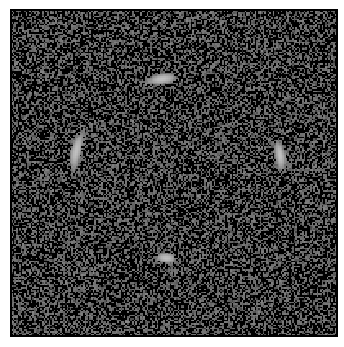

In [3]:
# lensing quantities
#kwargs_shear = {'gamma1': 0.02, 'gamma2': -0.02}  # shear values to the source plane
kwargs_shear = {'gamma1': 0.0, 'gamma2': -0.0}  # shear values to the source plane
kwargs_pemd = {'theta_E': 3., 'gamma': 2., 'center_x': 0.0, 'center_y': 0.0, 'e1': -0.2, 'e2': 0.0}  # parameters of the deflector lens model

# the lens model is a supperposition of an elliptical lens model with external shear
lens_model_list = ['EPL', 'SHEAR']
kwargs_lens_true = [kwargs_pemd, kwargs_shear]
lens_model_class = LensModel(lens_model_list=lens_model_list)

source_type = 'GAUSSIAN'  # 'GAUSSIAN' or 'SERSIC'

source_x = 0.1
source_y = 0.13


# Sersic parameters in the initial simulation
phi_G, q = 0.8, 1
e1, e2 = param_util.phi_q2_ellipticity(phi_G, q)
if source_type == 'SERSIC':
    kwargs_source_true = [{'amp': 1000, 'R_sersic': 0.05, 'n_sersic': 1., 'e1': e1, 'e2': e2, 'center_x': source_x, 'center_y': source_y}]
    source_model_list = ['SERSIC_ELLIPSE']
else:
    kwargs_source_true = [{'amp': 20, 'sigma': 0.04, 'e1': e1, 'e2': e2, 'center_x': source_x, 'center_y': source_y}]
    source_model_list = ['GAUSSIAN_ELLIPSE']

source_model_class = LightModel(light_model_list=source_model_list)



lensEquationSolver = LensEquationSolver(lens_model_class)
x_image, y_image = lensEquationSolver.findBrightImage(source_x, source_y, kwargs_lens_true, numImages=4,
                                                      min_distance=deltaPix, search_window=numPix * deltaPix)
mag = lens_model_class.magnification(x_image, y_image, kwargs=kwargs_lens_true)


kwargs_numerics = {'supersampling_factor': 1}

imageModel = ImageModel(data_class, psf_class, lens_model_class, source_model_class, kwargs_numerics=kwargs_numerics)

# generate image
image_sim = imageModel.image(kwargs_lens_true, kwargs_source_true)
poisson = image_util.add_poisson(image_sim, exp_time=exp_time)
bkg = image_util.add_background(image_sim, sigma_bkd=sigma_bkg)
image_sim = image_sim + bkg + poisson

data_class.update_data(image_sim)
kwargs_data['image_data'] = image_sim


kwargs_model = {'lens_model_list': lens_model_list, 
                 'source_light_model_list': source_model_list,
                 }

# display the initial simulated image
cmap_string = 'gray'
cmap = plt.get_cmap(cmap_string)
cmap.set_bad(color='k', alpha=1.)
cmap.set_under('k')

v_min = -4
v_max = 2

f, axes = plt.subplots(1, 1, figsize=(6, 6), sharex=False, sharey=False)
ax = axes
im = ax.matshow(np.log10(image_sim), origin='lower', vmin=v_min, vmax=v_max, cmap=cmap, extent=[0, 1, 0, 1])
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ax.autoscale(False)
plt.show()

In [4]:
# make cutous and data instances of them
x_pos, y_pos = data_class.map_coord2pix(x_image, y_image)
ra_grid, dec_grid = data_class.pixel_coordinates

multi_band_list = []
for i in range(len(x_pos)):
    n_cut = 30
    x_c = int(x_pos[i])
    y_c = int(y_pos[i])
    image_cut = image_sim[int(y_c-n_cut):int(y_c+n_cut), int(x_c-n_cut):int(x_c+n_cut)]
    exposure_map_cut = data_class.exposure_map[int(y_c-n_cut):int(y_c+n_cut), int(x_c-n_cut):int(x_c+n_cut)]
    kwargs_data_i = {
        'background_rms': data_class.background_rms,
        'exposure_time': exposure_map_cut,
        'ra_at_xy_0': ra_grid[y_c-n_cut, x_c-n_cut], 'dec_at_xy_0': dec_grid[y_c-n_cut, x_c-n_cut], 'transform_pix2angle': data_class.transform_pix2angle
        , 'image_data': image_cut
        }
    multi_band_list.append([kwargs_data_i, kwargs_psf, kwargs_numerics])

-0.9979537652488905 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.02319702216159
reduced chi^2 of data  1 =  1.0073531042033281
reduced chi^2 of data  2 =  0.9807128609961109
reduced chi^2 of data  3 =  0.9805520736345333


/Users/sibirrer/Software/lenstronomy/lenstronomy/Plots/multi_patch_plot.py:38: RuntimeWarning: divide by zero encountered in log10
  log_model = np.log10(self._model_joint)
/Users/sibirrer/Software/lenstronomy/lenstronomy/Plots/multi_patch_plot.py:166: RuntimeWarning: divide by zero encountered in log10
  image_plot = np.log10(image)
/Users/sibirrer/Software/lenstronomy/lenstronomy/Plots/multi_patch_plot.py:166: RuntimeWarning: invalid value encountered in log10
  image_plot = np.log10(image)


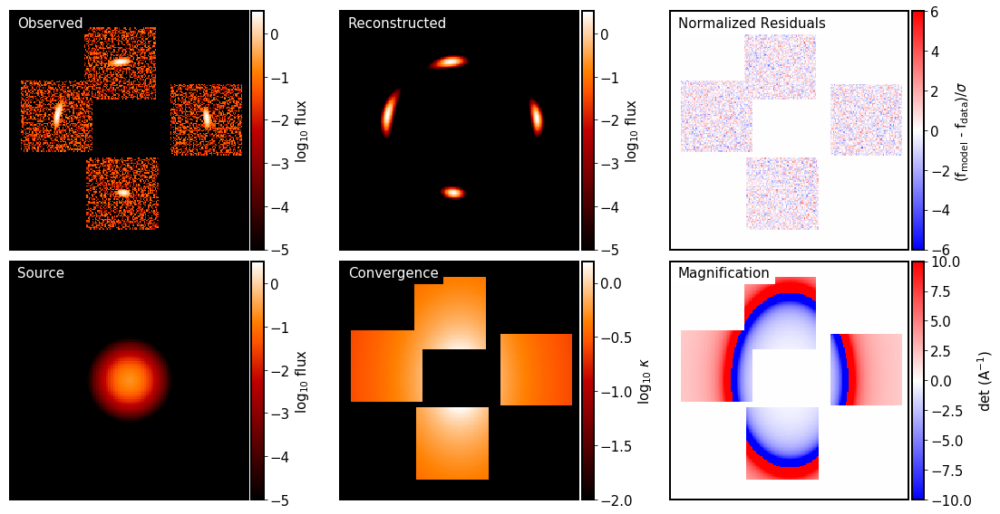

In [5]:
# plot jointly the data, and residuals of the perfect fit
from lenstronomy.Plots.multi_patch_plot import MultiPatchPlot

kwargs_true = {'kwargs_lens': kwargs_lens_true, 'kwargs_source': kwargs_source_true}

multi_plot = MultiPatchPlot(multi_band_list=multi_band_list, 
                            kwargs_model=kwargs_model, kwargs_params=kwargs_true, 
                            multi_band_type='joint-linear', kwargs_pixel_grid=kwargs_pixel_grid,
                            kwargs_likelihood=None, verbose=True, cmap_string="gist_heat")




f, axes = multi_plot.plot_main(**{'no_arrow': True, 'no_scale_bar': True})


[{'radial_stretch': 1.0, 'tangential_stretch': 4.05930436014838, 'curvature': 0.30551079326680525, 'direction': 0.15961048307514267, 'center_x': 3.231601805309923, 'center_y': 0.5202226917742886}, {'radial_stretch': 1.0, 'tangential_stretch': 5.15938319125393, 'curvature': 0.3250358455283056, 'direction': 2.929272976874551, 'center_x': -3.0074980927796013, 'center_y': 0.648322475969622}, {'radial_stretch': 1.0000000000000002, 'tangential_stretch': -3.855838780711021, 'curvature': 0.3463084007632079, 'direction': 1.700361598734116, 'center_x': -0.37308671839591323, 'center_y': 2.8633960621043797}, {'radial_stretch': 1.0, 'tangential_stretch': -2.567897811969417, 'curvature': 0.38034067014936634, 'direction': -1.667290262706566, 'center_x': -0.2533104244632576, 'center_y': -2.6169907546340516}]


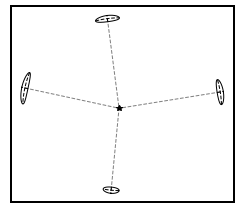

In [6]:
lens_model_list_arcs = []
kwargs_lens_arcs = []

curved_arc_type = 'CURVED_ARC_TAN_DIFF'

from lenstronomy.LensModel.lens_model_extensions import LensModelExtensions
ext = LensModelExtensions(lens_model_class)

for i in range(len(x_image)):
    lens_model_list_arcs.append(curved_arc_type)
    kwargs_arc_i = ext.curved_arc_estimate(x_image[i], y_image[i], kwargs_lens_true)
    kwargs_lens_arcs.append(kwargs_arc_i)

lens_model_arcs = LensModel(lens_model_list=lens_model_list_arcs)
f, ax = plt.subplots(1, 1, figsize=(4, 4))
lens_plot.curved_arc_illustration(ax, lens_model_arcs, kwargs_lens_arcs)
print(kwargs_lens_arcs)

In [7]:
# joint modeling of the individual cutouts

# lens model choicers
fixed_lens = []
kwargs_lens_init = []
kwargs_lens_sigma = []
kwargs_lower_lens = []
kwargs_upper_lens = []

fixed_lens.append({}) 
kwargs_lens_init.append(kwargs_pemd)
kwargs_lens_sigma.append({'theta_E': .2, 'e1': 0.1, 'e2': 0.1, 'gamma': 0.1, 'center_x': 0.01, 'center_y': 0.01})
kwargs_lower_lens.append({'theta_E': 0.01, 'e1': -0.5, 'e2': -0.5, 'gamma': 1.5, 'center_x': -10, 'center_y': -10})
kwargs_upper_lens.append({'theta_E': 10, 'e1': 0.5, 'e2': 0.5, 'gamma': 2.5, 'center_x': 10, 'center_y': 10})

fixed_lens.append({'ra_0': 0, 'dec_0': 0})
kwargs_lens_init.append(kwargs_shear)
kwargs_lens_sigma.append({'gamma1': 0.1, 'gamma2': 0.1})
kwargs_lower_lens.append({'gamma1': -0.3, 'gamma2': -0.3})
kwargs_upper_lens.append({'gamma1': 0.3, 'gamma2': 0.3})

lens_params = [kwargs_lens_init, kwargs_lens_sigma, fixed_lens, kwargs_lower_lens, kwargs_upper_lens]


fixed_source = []
kwargs_source_init = []
kwargs_source_sigma = []
kwargs_lower_source = []
kwargs_upper_source = []

fixed_source.append({})
kwargs_source_init.append(kwargs_source_true[0])
if source_type == 'SERSIC':
    kwargs_source_sigma.append({'n_sersic': 0.5, 'R_sersic': 0.05, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.1})
    kwargs_lower_source.append({'e1': -0.3, 'e2': -0.3, 'R_sersic': 0.01, 'n_sersic': .5, 'center_x': -10, 'center_y': -10})
    kwargs_upper_source.append({'e1': 0.3, 'e2': 0.3, 'R_sersic': 10, 'n_sersic': 5., 'center_x': 10, 'center_y': 10})
else:
    kwargs_source_sigma.append({'sigma': 0.05, 'e1': 0.1, 'e2': 0.1, 'center_x': 0.1, 'center_y': 0.1})
    kwargs_lower_source.append({'e1': -0.3, 'e2': -0.3, 'sigma': 0.01, 'center_x': -10, 'center_y': -10})
    kwargs_upper_source.append({'e1': 0.3, 'e2': 0.3, 'sigma': 10, 'center_x': 10, 'center_y': 10})
source_params = [kwargs_source_init, kwargs_source_sigma, fixed_source, kwargs_lower_source, kwargs_upper_source]

kwargs_params = {'lens_model': lens_params,
                'source_model': source_params}



# numerical options and fitting sequences

num_source_model = len(source_model_list)

kwargs_constraints = {}

kwargs_likelihood = {'check_bounds': True,
                     'source_marg': False}

kwargs_data_joint = {'multi_band_list': multi_band_list, 'multi_band_type': 'joint-linear'}

from lenstronomy.Workflow.fitting_sequence import FittingSequence

mpi = False  # MPI possible, but not supported through that notebook.

from lenstronomy.Workflow.fitting_sequence import FittingSequence
fitting_seq = FittingSequence(kwargs_data_joint, kwargs_model, kwargs_constraints, kwargs_likelihood, kwargs_params)

fitting_kwargs_list = [['PSO', {'sigma_scale': .1, 'n_particles': 100, 'n_iterations': 100}],
        ['MCMC', {'n_burn': 1000, 'n_run': 1000, 'walkerRatio': 10, 'sigma_scale': .1}]
]

start_time = time.time()
chain_list_epl = fitting_seq.fit_sequence(fitting_kwargs_list)
kwargs_result_epl = fitting_seq.best_fit()
end_time = time.time()
print(end_time - start_time, 'total time needed for computation')
print('============ CONGRATULATION, YOUR JOB WAS SUCCESSFUL ================ ')



Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
Max iteration reached! Stopping.
-0.9981650210978023 reduced X^2 of best position
-7178.303749224845 logL
14383.0 effective number of data points
[{'theta_E': 2.9993484866478592, 'gamma': 2.001162278164481, 'e1': -0.19827465243390568, 'e2': -2.5666880546105216e-05, 'center_x': 0.00047876791673036393, 'center_y': -0.0005738429112324378}, {'gamma1': 0.0009442859161331423, 'gamma2': -5.371389118806843e-05, 'ra_0': 0, 'dec_0': 0}] lens result
[{'amp': 1, 'sigma': 0.040032730631057396, 'e1': 0.0007098009636474094, 'e2': -0.004015524722384767, 'center_x': 0.09972558415170665, 'center_y': 0.12967629063237365}] source result
[] lens light result
[] point source result
{} special param result
147.63070583343506 time used for  PSO


100%|██████████| 2000/2000 [1:01:09<00:00,  2.06s/it]

Computing the MCMC...
Number of walkers =  130
Burn-in iterations:  1000
Sampling iterations (in current run): 2000
3671.545479774475 time taken for MCMC sampling
3819.270332813263 total time needed for computation
============ CONGRATULATION, YOUR JOB WAS SUCCESSFUL ================ 


-0.9970712789254882 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.0231830499352692
reduced chi^2 of data  1 =  1.0057813563929303
reduced chi^2 of data  2 =  0.9791725701364036
reduced chi^2 of data  3 =  0.9801481392373502


/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:10: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  # Remove the CWD from sys.path while we load stuff.


number of non-linear parameters in the MCMC process:  13
parameters in order:  ['theta_E_lens0', 'gamma_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'gamma1_lens1', 'gamma2_lens1', 'sigma_source_light0', 'e1_source_light0', 'e2_source_light0', 'center_x_source_light0', 'center_y_source_light0']
number of evaluations in the MCMC process:  130000


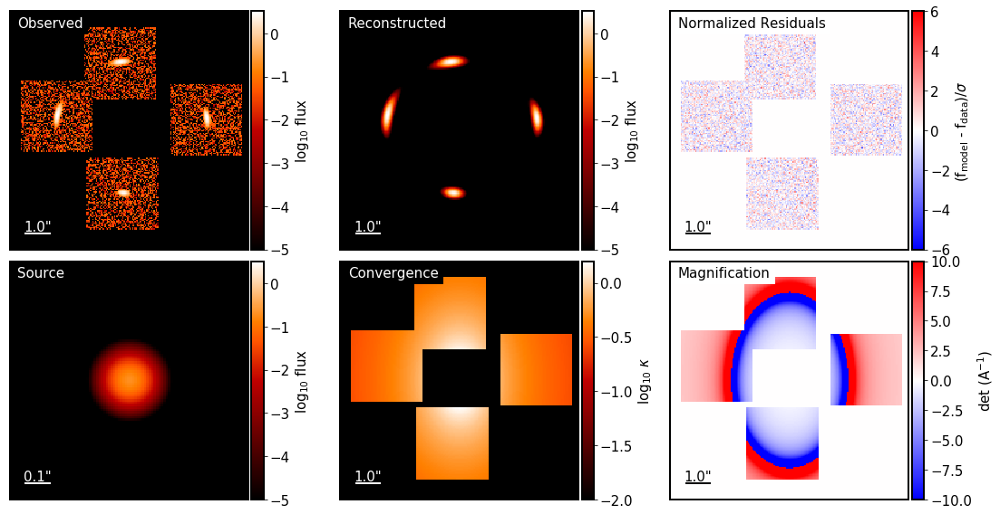

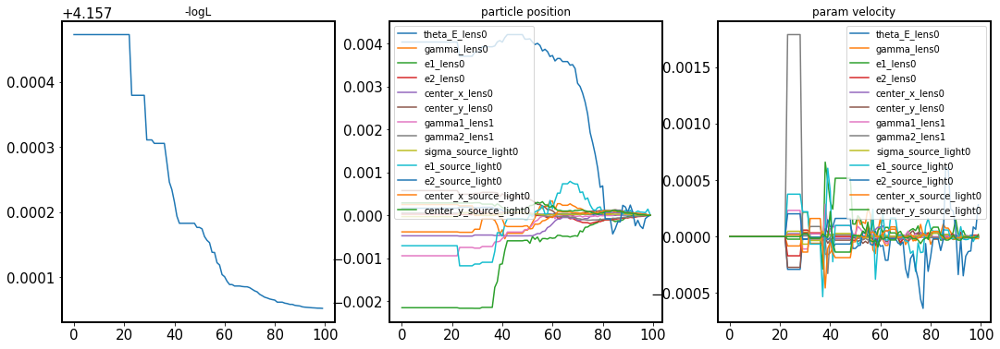

<Figure size 432x288 with 0 Axes>

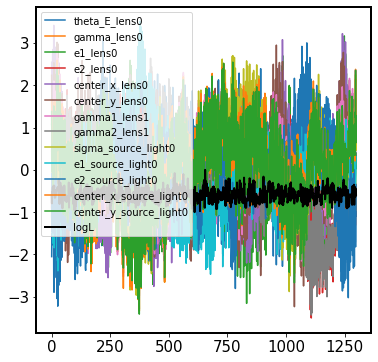

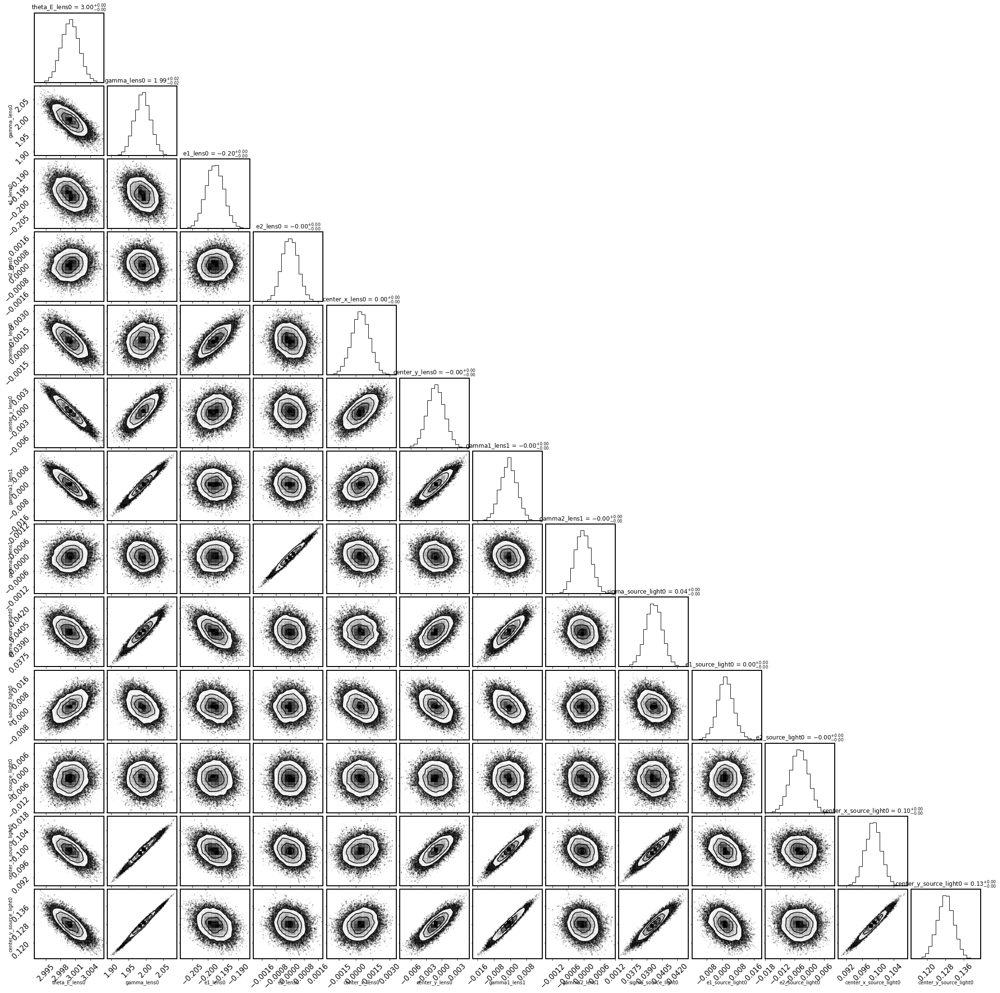

In [8]:
multi_plot = MultiPatchPlot(multi_band_list=multi_band_list, 
                            kwargs_model=kwargs_model, kwargs_params=kwargs_result_epl, 
                            multi_band_type='joint-linear', kwargs_pixel_grid=kwargs_pixel_grid,
                            kwargs_likelihood=None, verbose=True, cmap_string="gist_heat")


param_epl = fitting_seq.param_class

f, axes = multi_plot.plot_main(**{'no_arrow': True})
f.show()

from lenstronomy.Plots import chain_plot
for i in range(len(chain_list_epl)):
    chain_plot.plot_chain_list(chain_list_epl, i)
    
sampler_type, samples_mcmc_epl, param_mcmc_epl, dist_mcmc_epl  = chain_list_epl[1]

print("number of non-linear parameters in the MCMC process: ", len(param_mcmc_epl))
print("parameters in order: ", param_mcmc_epl)
print("number of evaluations in the MCMC process: ", np.shape(samples_mcmc_epl)[0])
import corner

plot = corner.corner(samples_mcmc_epl, labels=param_mcmc_epl, show_titles=True)

## fitting of curved arc models

-0.9990347234203786 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.0253150089078003
reduced chi^2 of data  1 =  1.0082323657572771
reduced chi^2 of data  2 =  0.9812806826874363
reduced chi^2 of data  3 =  0.9813108363290011


/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:112: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


[{'radial_stretch': 1.0, 'tangential_stretch': 4.05930436014838, 'curvature': 0.30551079326680525, 'direction': 0.15961048307514267, 'center_x': 3.231601805309923, 'center_y': 0.5202226917742886, 'dtan_dtan': 0.08258081701685022}, {'alpha_x': array(3.13160181), 'alpha_y': array(0.39022269)}, {'radial_stretch': 1.0, 'tangential_stretch': 5.15938319125393, 'curvature': 0.3250358455283056, 'direction': 2.929272976874551, 'center_x': -3.0074980927796013, 'center_y': 0.648322475969622, 'dtan_dtan': -0.1587050036612016}, {'alpha_x': array(-3.10749809), 'alpha_y': array(0.51832248)}, {'radial_stretch': 1.0000000000000002, 'tangential_stretch': -3.855838780711021, 'curvature': 0.3463084007632079, 'direction': 1.700361598734116, 'center_x': -0.37308671839591323, 'center_y': 2.8633960621043797, 'dtan_dtan': 0.26449068014818766}, {'alpha_x': array(-0.47308672), 'alpha_y': array(2.73339606)}, {'radial_stretch': 1.0, 'tangential_stretch': -2.567897811969417, 'curvature': 0.38034067014936634, 'direc

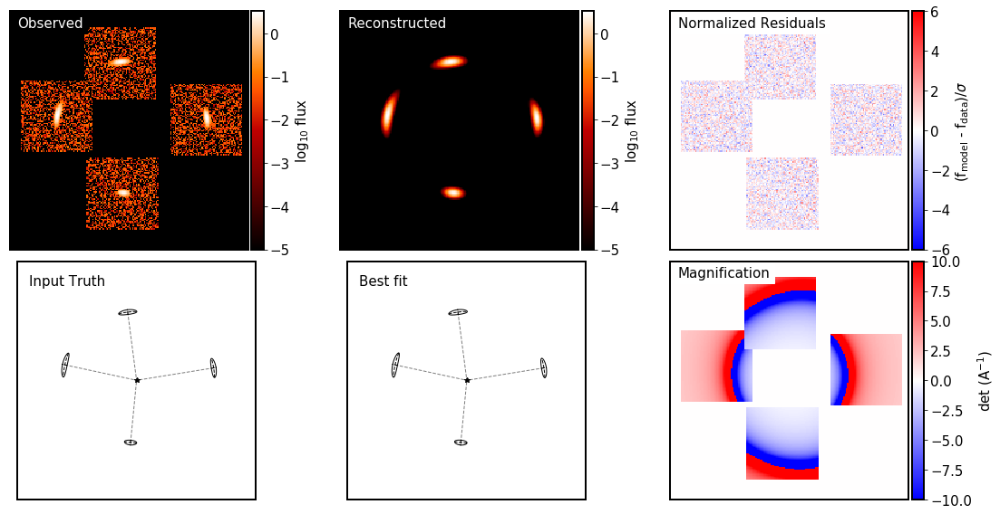

In [9]:
# joint modeling of the individual cutouts

ellipticity_fixed = False

lens_model_list_arc = []
fixed_lens_arc = []
kwargs_lens_init_arc = []
kwargs_lens_sigma_arc = []
kwargs_lens_lower_arc = []
kwargs_lens_upper_arc = []
index_lens_model_list = []

kwargs_lens_arc_true = []

# lens model choicers
#tan_diff=False
#if curved_arc_type == 'CURVED_ARC_TAN_DIFF':
#    tan_diff = True
curved_arc_type_list = ['CURVED_ARC_TAN_DIFF', 'CURVED_ARC_TAN_DIFF', 'CURVED_ARC_TAN_DIFF', 'CURVED_ARC_TAN_DIFF']

lens_index = 0
for i in range(len(x_image)):
    curved_arc_type = curved_arc_type_list[i]
    if curved_arc_type == 'CURVED_ARC_TAN_DIFF':
        tan_diff = True
    else:
        tan_diff = False
    kwargs_arc_init = ext.curved_arc_estimate(x_image[i], y_image[i], kwargs_result_epl['kwargs_lens'], tan_diff=tan_diff)
    kwargs_arc_true = ext.curved_arc_estimate(x_image[i], y_image[i], kwargs_lens_true, tan_diff=tan_diff)
    lens_model_list_arc.append(curved_arc_type)
    kwargs_lens_arc_true.append(kwargs_arc_true)

    fixed_lens_arc.append({'center_x': x_image[i], 'center_y': y_image[i]})
    kwargs_lens_init_arc.append(kwargs_arc_init)

    kwargs_lens_sigma_arc.append({'tangential_stretch': 0.5, 'radial_stretch':.1, 'curvature': 0.5, 
                'direction': np.pi/100, 'dtan_dtan': 0.1})
    kwargs_lens_lower_arc.append({'tangential_stretch': -100, 'radial_stretch':-1.5, 'curvature': 0.0005, 
                'direction': -2*np.pi, 'dtan_dtan': -0.5})
    kwargs_lens_upper_arc.append({'tangential_stretch': 100, 'radial_stretch':1.5, 'curvature': 5, 
                'direction': 2*np.pi, 'dtan_dtan': 0.5})
    lens_model_list_arc.append('SHIFT')

    fixed_lens_arc.append({})
    alpha_x, alpha_y = lens_model_class.alpha(x_image[i], y_image[i], kwargs_lens_true)
    kwargs_lens_init_arc.append({'alpha_x': alpha_x, 'alpha_y': alpha_y})
    kwargs_lens_sigma_arc.append({'alpha_x': 0.1, 'alpha_y': 0.1})
    kwargs_lens_lower_arc.append({'alpha_x': alpha_x - 1, 'alpha_y': alpha_y - 1})
    kwargs_lens_upper_arc.append({'alpha_x': alpha_x + 1, 'alpha_y': alpha_y + 1})
    index_lens_model_list.append([lens_index, lens_index + 1])
    
    kwargs_lens_arc_true.append({'alpha_x': alpha_x, 'alpha_y': alpha_y})
    lens_index += 2

lens_params_arc = [kwargs_lens_init_arc, kwargs_lens_sigma_arc, fixed_lens_arc, kwargs_lens_lower_arc, kwargs_lens_upper_arc]

if source_type == 'SERSIC':
    fixed_source_arc = [{'R_sersic': kwargs_source_true[0]['R_sersic'],
                         'n_sersic': kwargs_source_true[0]['n_sersic'],
                         'center_x': kwargs_source_true[0]['center_x'], 
                         'center_y': kwargs_source_true[0]['center_y']}]
else:
    fixed_source_arc = [{'sigma': kwargs_source_true[0]['sigma'],
                         'center_x': kwargs_source_true[0]['center_x'], 
                         'center_y': kwargs_source_true[0]['center_y']}]
if ellipticity_fixed:
    fixed_source_arc[0]['e1'] = kwargs_source_true[0]['e1']
    fixed_source_arc[0]['e2'] = kwargs_source_true[0]['e2']
source_params = [kwargs_source_true, kwargs_source_sigma, fixed_source_arc, kwargs_lower_source, kwargs_upper_source]




kwargs_params_arc = {'lens_model': lens_params_arc,
                'source_model': source_params}


kwargs_model_arc = {'lens_model_list': lens_model_list_arc,
                    'index_lens_model_list': index_lens_model_list,
                    'source_light_model_list': source_model_list
                 }

kwargs_params_true = {'kwargs_lens': kwargs_lens_init_arc,
                     'kwargs_source': kwargs_source_true}

multi_plot = MultiPatchPlot(multi_band_list=multi_band_list, 
                            kwargs_model=kwargs_model_arc, kwargs_params=kwargs_params_true, 
                            multi_band_type='joint-linear', kwargs_pixel_grid=kwargs_pixel_grid,
                            kwargs_likelihood=None, verbose=True, cmap_string="gist_heat")

lens_model_arcs = LensModel(lens_model_list_arc)
kwargs_plot = {'no_arrow': True, 'no_scale_bar': True}
f, axes = plt.subplots(2, 3, figsize=(16, 8))
multi_plot.data_plot(ax=axes[0, 0], **kwargs_plot)
multi_plot.model_plot(ax=axes[0, 1], image_names=True, **kwargs_plot)
multi_plot.normalized_residual_plot(ax=axes[0, 2], v_min=-6, v_max=6, **kwargs_plot)

lens_plot.curved_arc_illustration(axes[1, 0], lens_model_arcs, kwargs_lens_arc_true)
axes[1, 0].set_xlim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 0].set_ylim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 0].text(-numPix*deltaPix * (1-0.1)/2, numPix*deltaPix * (1-0.2)/2, 'Input Truth', color='k', fontsize=15,
                backgroundcolor='w')
lens_plot.curved_arc_illustration(axes[1, 1], lens_model_arcs, kwargs_lens_init_arc)
axes[1, 1].set_xlim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 1].set_ylim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 1].text(-numPix*deltaPix * (1-0.1)/2, numPix*deltaPix * (1-0.2)/2, 'Best fit', color='k', fontsize=15,
                backgroundcolor='w')
multi_plot.magnification_plot(ax=axes[1, 2], **kwargs_plot)
f.tight_layout()
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)

f.show()

print(kwargs_lens_arc_true)


In [10]:

fitting_seq_arc = FittingSequence(kwargs_data_joint, kwargs_model_arc, kwargs_constraints, kwargs_likelihood, kwargs_params_arc)

fitting_kwargs_list = [['PSO', {'sigma_scale': 0.1, 'n_particles': 200, 'n_iterations': 500}],
        ['MCMC', {'n_burn': 2000, 'n_run': 2000, 'walkerRatio': 10, 'sigma_scale': .1}]
]

start_time = time.time()
chain_list_arc = fitting_seq_arc.fit_sequence(fitting_kwargs_list)
kwargs_result_arc = fitting_seq_arc.best_fit()
end_time = time.time()
print(end_time - start_time, 'total time needed for computation')
print('============ CONGRATULATION, YOUR JOB WAS SUCCESSFUL ================ ')



Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
Converged after 369 iterations!
Best fit found:  -7173.044772527281 [4.082848827949196, 0.9951081787132267, 0.33189644216166053, -0.0849640493241158, 0.15397771146728811, 3.131817070980857, 0.39127412594134686, 5.267870796902467, 0.9909552152520642, 0.3131384387954984, -0.1509409056147657, 2.920884397912736, -3.1081765906557006, 0.5188533894228812, -3.9170613459750254, 1.003019841735451, 0.36107609652085154, 0.2659015570812833, 1.6922583832356741, -0.4732950422754177, 2.7327947856069783, -2.558314137107623, 1.0090961434743897, 0.37709907595820774, 0.012951753043839118, -1.668941532111573, -0.35325125053422324, -2.7473621007388767, 0.0066650634992564345, -0.019234216760534915]
-0.9986140571526215 reduced X^2 of best position
-7173.044772527281 logL
14366.0 effective number of data points
[{'tangential_stretch': 4.082848827949196, 'r

100%|██████████| 4000/4000 [1:30:22<00:00,  1.26s/it]

Computing the MCMC...
Number of walkers =  300
Burn-in iterations:  2000
Sampling iterations (in current run): 4000
5424.224483251572 time taken for MCMC sampling
5861.024973869324 total time needed for computation
============ CONGRATULATION, YOUR JOB WAS SUCCESSFUL ================ 


-0.996605829425804 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  1.0219797007559672
reduced chi^2 of data  1 =  1.0061083977822247
reduced chi^2 of data  2 =  0.979110411685425
reduced chi^2 of data  3 =  0.9792248074795991


/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:30: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


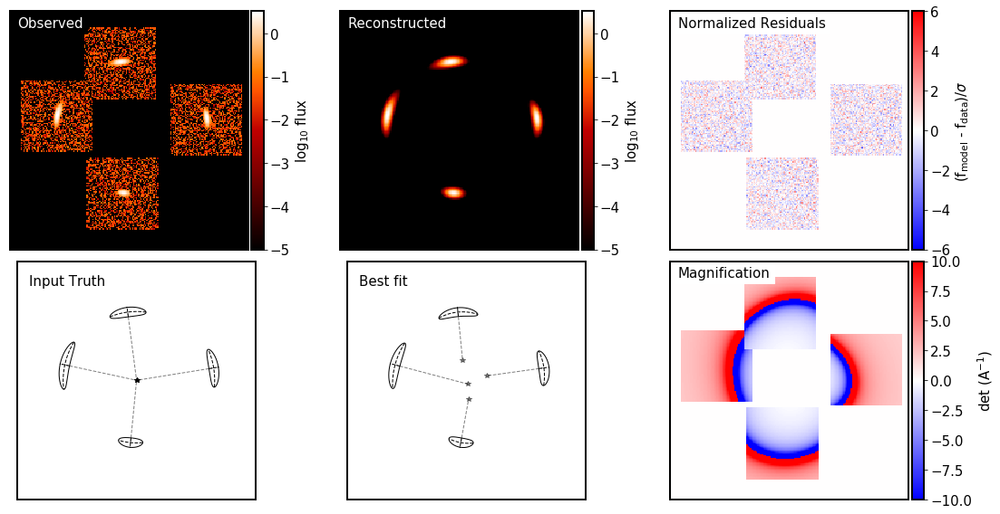

In [11]:
multi_plot = MultiPatchPlot(multi_band_list=multi_band_list, 
                            kwargs_model=kwargs_model_arc, kwargs_params=kwargs_result_arc, 
                            multi_band_type='joint-linear', kwargs_pixel_grid=kwargs_pixel_grid,
                            kwargs_likelihood=None, verbose=True, cmap_string="gist_heat")


kwargs_plot = {'no_arrow': True, 'no_scale_bar': True}
f, axes = plt.subplots(2, 3, figsize=(16, 8))
multi_plot.data_plot(ax=axes[0, 0], **kwargs_plot)
multi_plot.model_plot(ax=axes[0, 1], image_names=True, **kwargs_plot)
multi_plot.normalized_residual_plot(ax=axes[0, 2], v_min=-6, v_max=6, **kwargs_plot)

lens_plot.curved_arc_illustration(axes[1, 0], lens_model_arcs, kwargs_lens_arc_true, stretch_scale=0.2, with_centroid=True)
axes[1, 0].set_xlim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 0].set_ylim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 0].text(-numPix*deltaPix * (1-0.1)/2, numPix*deltaPix * (1-0.2)/2, 'Input Truth', color='k', fontsize=15,
                backgroundcolor='w')

lens_plot.curved_arc_illustration(axes[1, 1], lens_model_arcs, kwargs_result_arc['kwargs_lens'], stretch_scale=0.2, with_centroid=True)
axes[1, 1].set_xlim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 1].set_ylim([-numPix*deltaPix/2, numPix*deltaPix/2])
axes[1, 1].text(-numPix*deltaPix * (1-0.1)/2, numPix*deltaPix * (1-0.2)/2, 'Best fit', color='k', fontsize=15,
                backgroundcolor='w')

multi_plot.magnification_plot(ax=axes[1, 2], **kwargs_plot)
f.tight_layout()
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)
#plt.savefig('/Users/sibirrer/Science/Publications/ArcPhenomenology/example_reconstruction.pdf', format='pdf', dpi=None, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, transparent=False, bbox_inches=None, pad_inches=0.1, frameon=None, metadata=None)  
f.show()


number of non-linear parameters in the MCMC process:  30
parameters in order:  ['tangential_stretch_lens0', 'radial_stretch_lens0', 'curvature_lens0', 'dtan_dtan_lens0', 'direction_lens0', 'alpha_x_lens1', 'alpha_y_lens1', 'tangential_stretch_lens2', 'radial_stretch_lens2', 'curvature_lens2', 'dtan_dtan_lens2', 'direction_lens2', 'alpha_x_lens3', 'alpha_y_lens3', 'tangential_stretch_lens4', 'radial_stretch_lens4', 'curvature_lens4', 'dtan_dtan_lens4', 'direction_lens4', 'alpha_x_lens5', 'alpha_y_lens5', 'tangential_stretch_lens6', 'radial_stretch_lens6', 'curvature_lens6', 'dtan_dtan_lens6', 'direction_lens6', 'alpha_x_lens7', 'alpha_y_lens7', 'e1_source_light0', 'e2_source_light0']
number of evaluations in the MCMC process:  600000


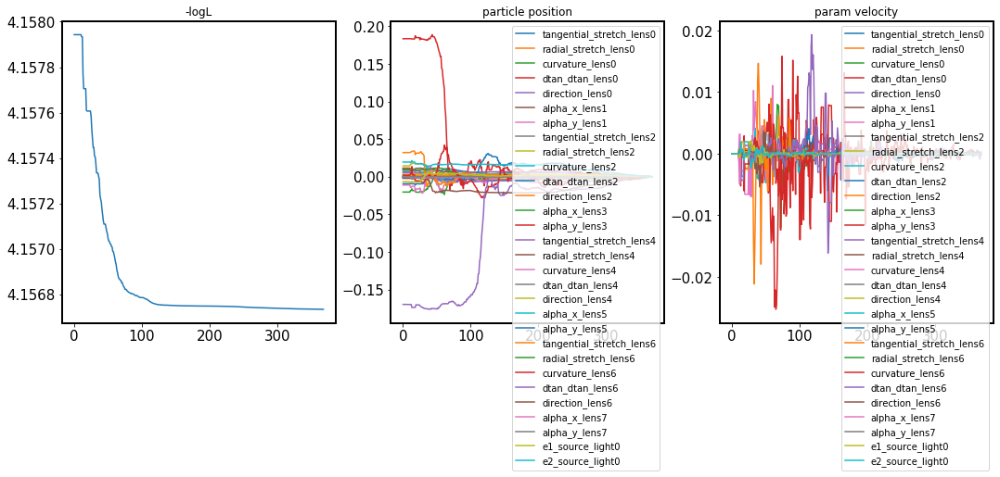

<Figure size 432x288 with 0 Axes>

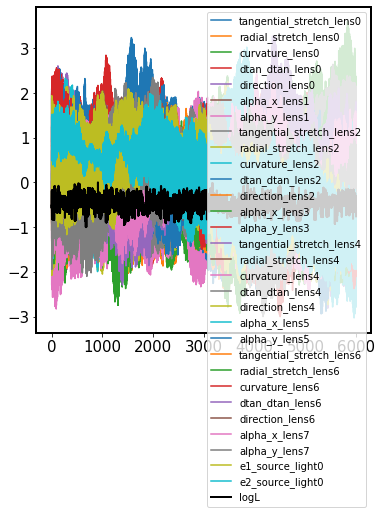

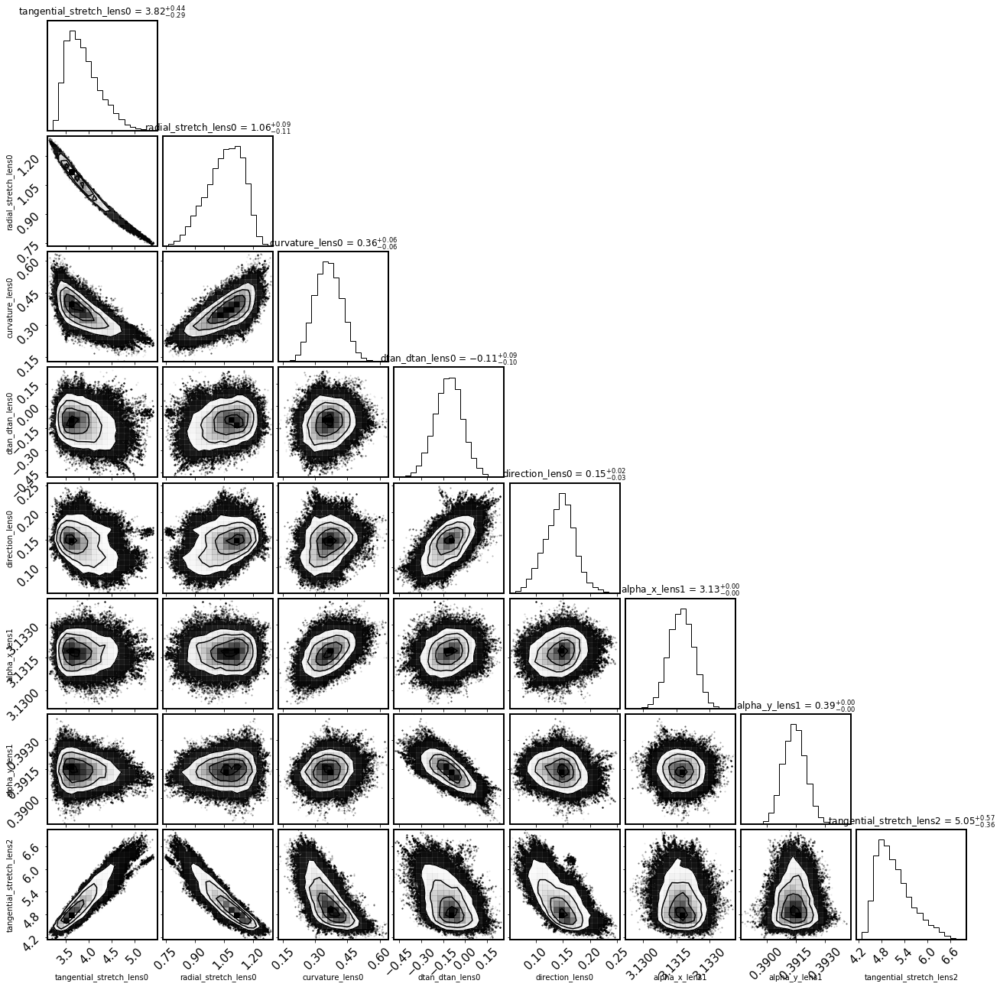

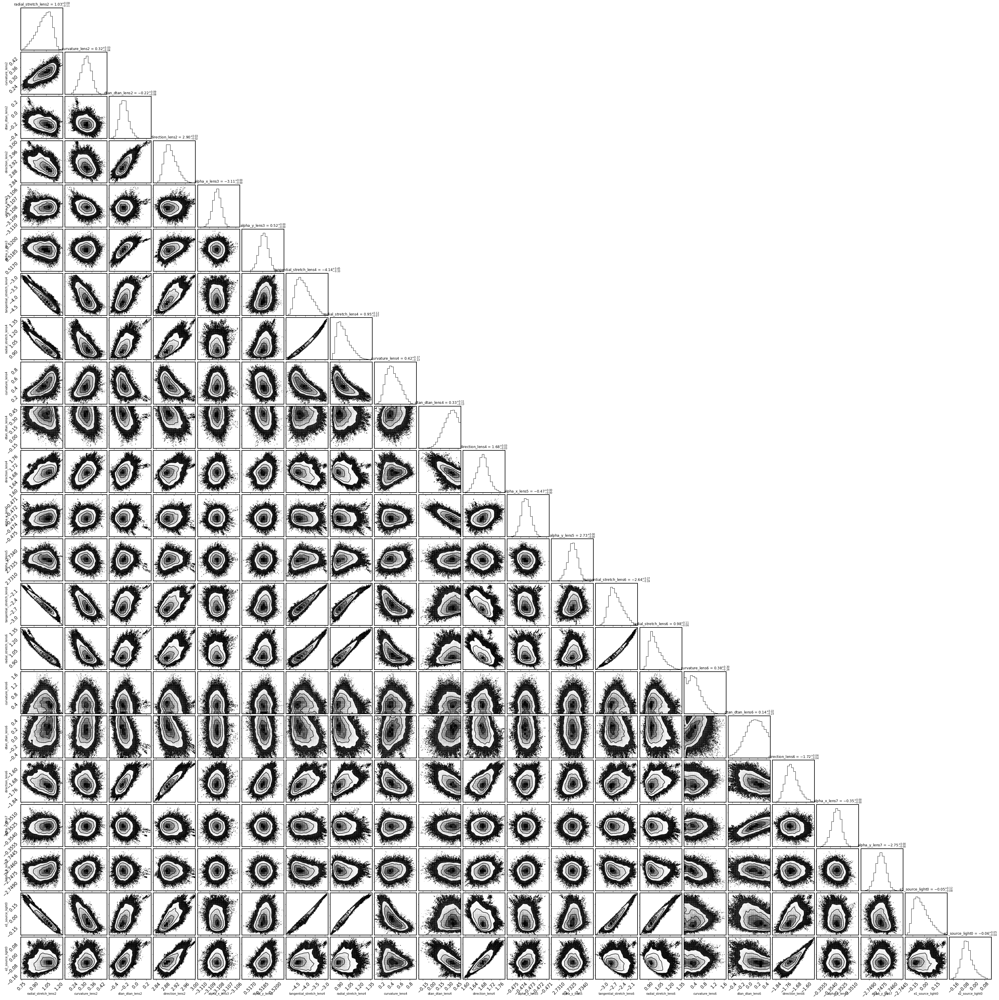

In [12]:
for i in range(len(chain_list_arc)):
    chain_plot.plot_chain_list(chain_list_arc, i)
    
sampler_type_arc, samples_mcmc_arc, param_mcmc_arc, dist_mcmc_arc  = chain_list_arc[1]

print("number of non-linear parameters in the MCMC process: ", len(param_mcmc_arc))
print("parameters in order: ", param_mcmc_arc)
print("number of evaluations in the MCMC process: ", np.shape(samples_mcmc_arc)[0])

import corner

#plot = corner.corner(samples_mcmc, labels=param_mcmc, show_titles=True)
plot = corner.corner(samples_mcmc_arc[:,:8], labels=param_mcmc_arc[:8], show_titles=True)
plot = corner.corner(samples_mcmc_arc[:,8:], labels=param_mcmc_arc[8:], show_titles=True)

In [13]:
param_arc = fitting_seq_arc.param_class


levels = [0.68,0.95]
alpha = 0.8
kwargs_corner = {'bins': 20, 'alpha': 0.2, 'smooth': 0.8, 'smooth1d': None, 
                 'levels': levels, 'truth_color': 'k',
                 'color': 'steelblue',
                 'fill_contours': True, 'plot_datapoints': False,
                 'range': None, 'contourf_kwargs': {'color': 'steelblue'},
                 'hist_kwargs': {'density': True, 'color': 'steelblue'},
                 'title_kwargs': dict(fontsize=15),
                 'label_kwargs': dict(fontsize=20)}

kwargs_corner_epl = {'bins': 20, 'alpha': 0.2, 'smooth': 0.8, 'smooth1d': None, 
                 'levels': levels, 'truth_color': 'k',
                 'color': 'crimson',
                 'fill_contours': True, 'plot_datapoints': False,
                 'range': None, 'contourf_kwargs': {'color': 'crimson'},
                 'hist_kwargs': {'density': True, 'color': 'crimson'},
                 'title_kwargs': dict(fontsize=15),
                 'label_kwargs': dict(fontsize=15)}

def plot_posterior_arc(index, dr=fwhm):

    mcmc_new_list = []
    labels_new = [r"$\lambda_{\rm rad}$", r"$\lambda_{\rm tan}$", r"$\phi_{\rm rad}$", r"$s_{\rm tan}$"]  #,  r"$q_{source}$"]
    kwargs_arc_true = ext.curved_arc_estimate(x_image[index], y_image[index], kwargs_lens_true)
    e1_truth, e2_truth = kwargs_source_true[0]['e1'], kwargs_source_true[0]['e2']
    phi, q_truth = param_util.ellipticity2phi_q(kwargs_source_true[0]['e1'], kwargs_source_true[0]['e2'])
    truths = [kwargs_arc_true['radial_stretch'], kwargs_arc_true['tangential_stretch'], kwargs_arc_true['direction'], kwargs_arc_true['curvature']]
    if ellipticity_fixed:
        pass
    else:
        labels_new += [r"$e_1$", r"$e_2$"]
        truths += [e1_truth, e2_truth]
    for i in range(len(samples_mcmc_arc)):
        index_lens = index*2
        # transform the parameter position of the MCMC chain in a lenstronomy convention with keyword arguments #
        kwargs_result = param_arc.args2kwargs(samples_mcmc_arc[i])
        kwargs_lens = kwargs_result['kwargs_lens']
        s_r = kwargs_lens[index_lens]['radial_stretch']
        s_t = kwargs_lens[index_lens]['tangential_stretch']
        phi = kwargs_lens[index_lens]['direction']
        curv = kwargs_lens[index_lens]['curvature']
        #r_source = kwargs_result['kwargs_source'][0]['R_sersic']
        e1, e2 = kwargs_result['kwargs_source'][0]['e1'], kwargs_result['kwargs_source'][0]['e2']
        phi_s, q_s = param_util.ellipticity2phi_q(e1, e2)
        if ellipticity_fixed:
            mcmc_new_list.append([s_r, s_t, phi, curv]) # q_s
        else:
            mcmc_new_list.append([s_r, s_t, phi, curv, e1, e2]) # q_s

    fig = corner.corner(np.array(mcmc_new_list), labels=labels_new, show_titles=True, truths=truths, **kwargs_corner)
    return fig
    
def posterior_stretch(lens_model_list):
    
    mcmc_new_list = []
    labels_new = []
    index = 0
    truths = []
    i_arc = 0
    for model in lens_model_list:
        if model in ['CURVED_ARC', 'CURVED_ARC_SIS_MST', 'CURVED_ARC_TAN_DIFF']:
            kwargs_arc_true = ext.curved_arc_estimate(x_image[index], y_image[index], kwargs_lens_true)
            labels_new += [r"$\lambda_{\rm rad, %s}$" % str(index), r"$\lambda_{\rm tan, %s}$" % str(index)]
            truths += [kwargs_arc_true['radial_stretch'], kwargs_arc_true['tangential_stretch']]
            index += 1
            i_arc += 1
    e1_truth, e2_truth = kwargs_source_true[0]['e1'], kwargs_source_true[0]['e2']
    phi, q_truth = param_util.ellipticity2phi_q(kwargs_source_true[0]['e1'], kwargs_source_true[0]['e2'])
    
    if ellipticity_fixed:
        pass
    else:
        labels_new += [r"$e_1$", r"$e_2$"]
        truths += [e1_truth, e2_truth]
                                  

    for i in range(len(samples_mcmc_arc)):
        param_list = []
        i_arc = 0
        # transform the parameter position of the MCMC chain in a lenstronomy convention with keyword arguments #
        kwargs_result = param_arc.args2kwargs(samples_mcmc_arc[i])
        for index_lens, model in enumerate(lens_model_list):
            if model in ['CURVED_ARC', 'CURVED_ARC_SIS_MST', 'CURVED_ARC_TAN_DIFF']:                     
                kwargs_lens = kwargs_result['kwargs_lens']
                s_r = kwargs_lens[index_lens]['radial_stretch']
                s_t = kwargs_lens[index_lens]['tangential_stretch']
                phi = kwargs_lens[index_lens]['direction']
                curv = kwargs_lens[index_lens]['curvature']

                param_list += [s_r, s_t]
                i_arc += 1

        e1, e2 = kwargs_result['kwargs_source'][0]['e1'], kwargs_result['kwargs_source'][0]['e2']
        phi_s, q_s = param_util.ellipticity2phi_q(e1, e2)
                                  
        if not ellipticity_fixed:
            param_list += [e1, e2]
        mcmc_new_list.append(param_list)
    
    # add (optional) constraints on local stretches from macro-model fit
    mcmc_macro_fit = []
    for i in range(len(samples_mcmc_epl)):
        param_list = []
        i_arc = 0
        kwargs_result = param_epl.args2kwargs(samples_mcmc_epl[i])
        for i_arc in range(len(x_image)):
            kwargs_arc = ext.curved_arc_estimate(x_image[i_arc], y_image[i_arc], kwargs_result['kwargs_lens'])
            s_r = kwargs_arc['radial_stretch']
            s_t = kwargs_arc['tangential_stretch']
            phi = kwargs_arc['direction']
            curv = kwargs_arc['curvature']

            param_list += [s_r, s_t]

        #r_source = kwargs_result['kwargs_source'][0]['R_sersic']
        e1, e2 = kwargs_result['kwargs_source'][0]['e1'], kwargs_result['kwargs_source'][0]['e2']
        phi_s, q_s = param_util.ellipticity2phi_q(e1, e2)
                                  
        if not ellipticity_fixed:
            param_list += [e1, e2]
        mcmc_macro_fit.append(param_list)

    
    return np.array(mcmc_new_list), np.array(mcmc_macro_fit), truths, labels_new


/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/corner/core.py:660: UserWarning: The following kwargs were not used by contour: 'color'
  **contourf_kwargs,
/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:2: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  
/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:5: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  """
/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  
/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:11: UserWarning: Matplotlib is currently using module://ipykernel

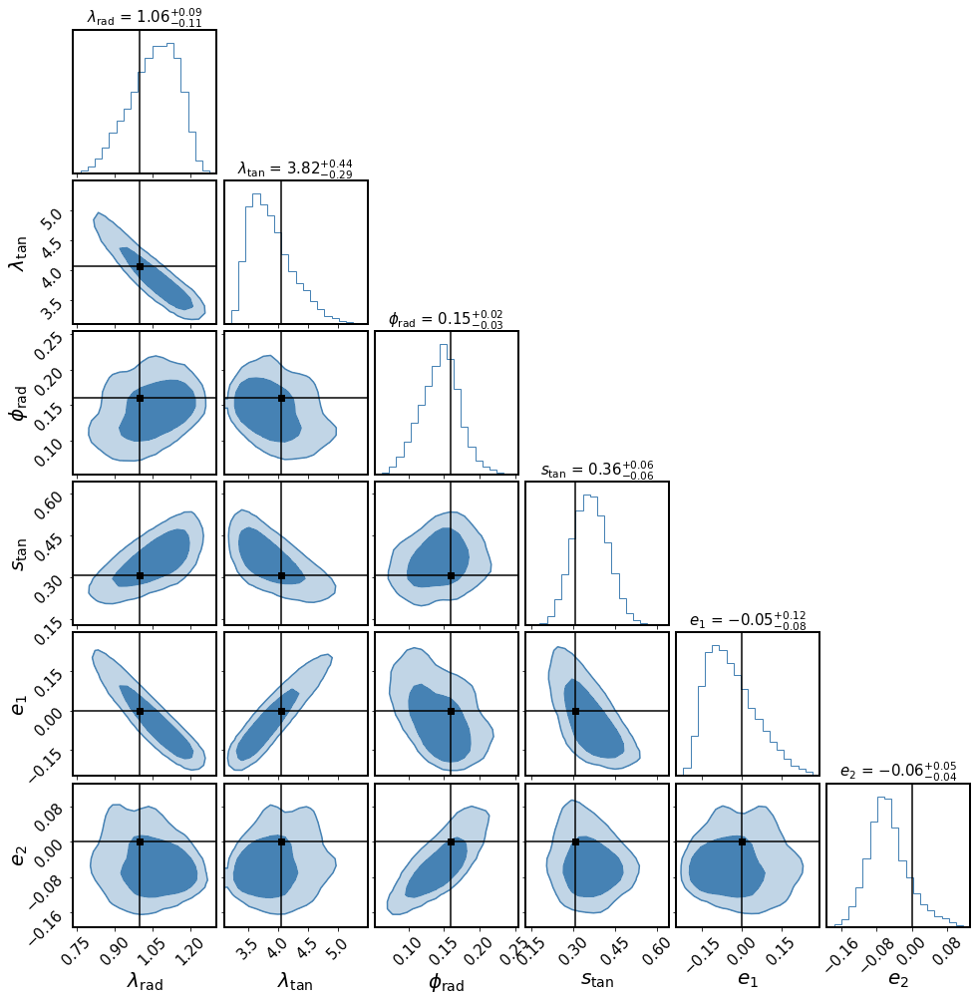

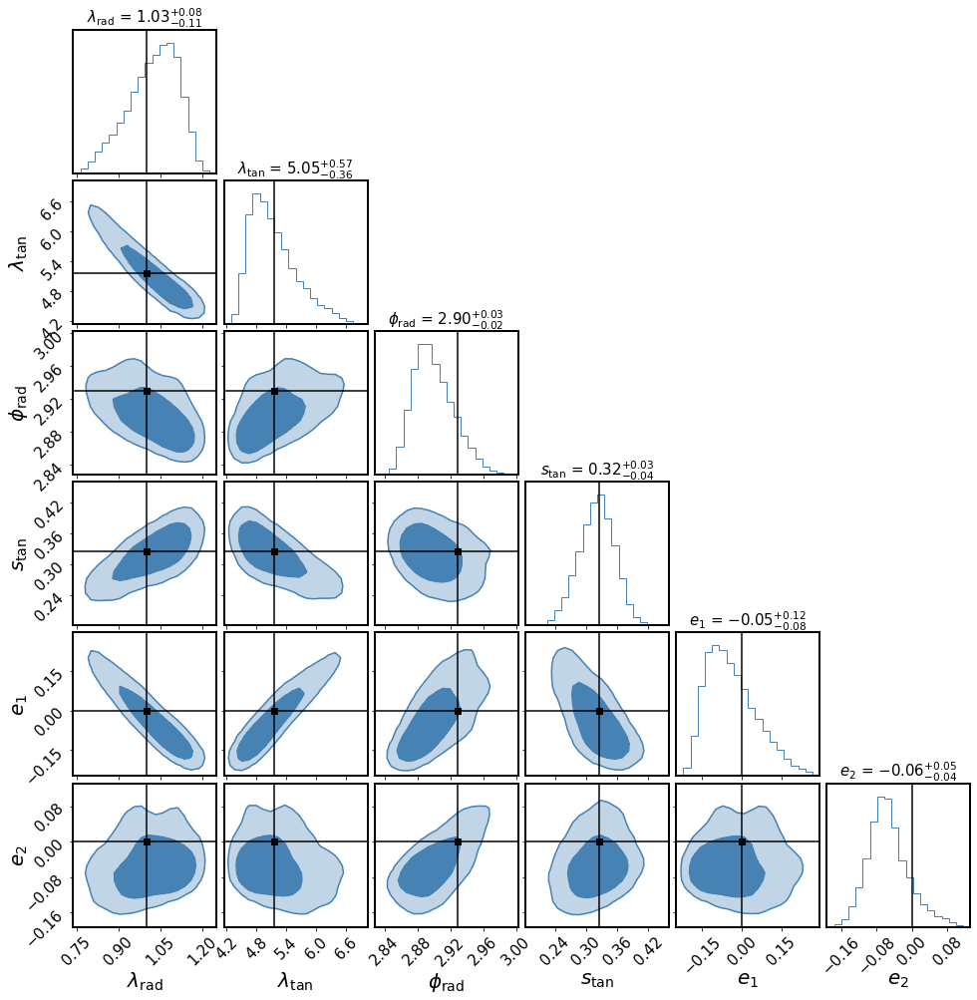

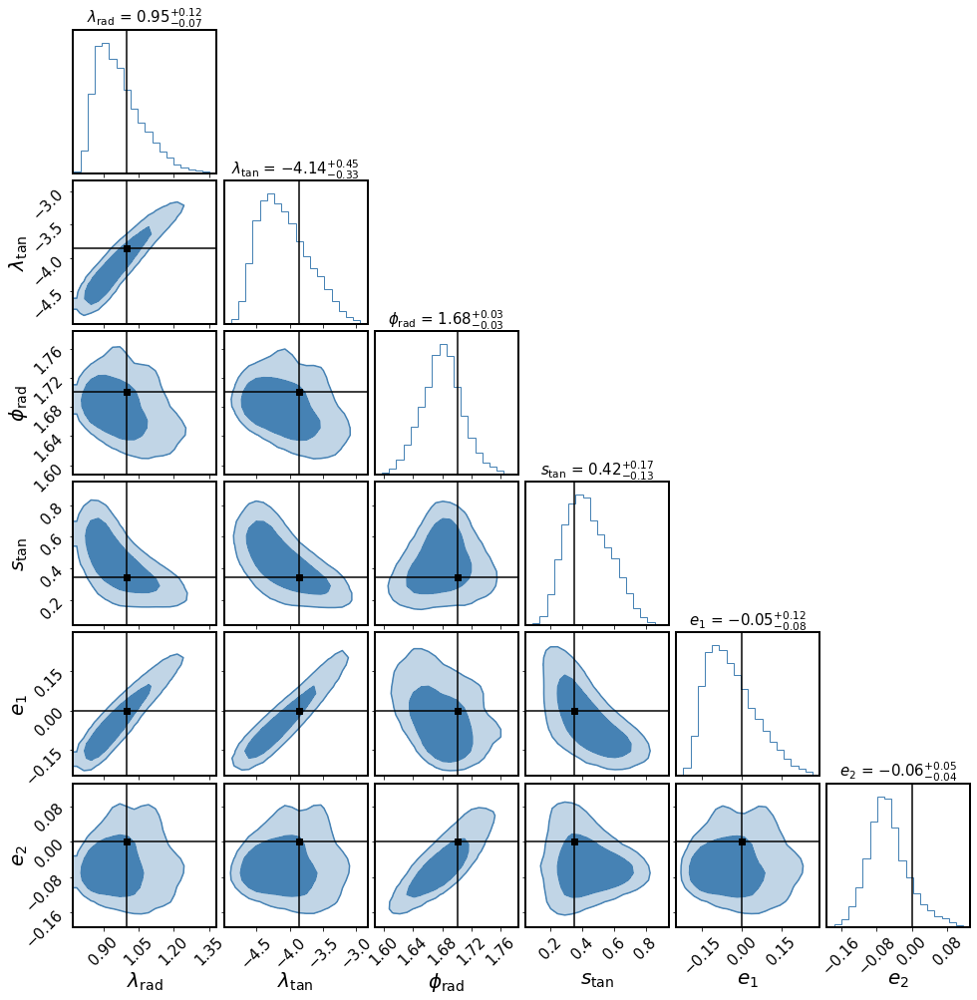

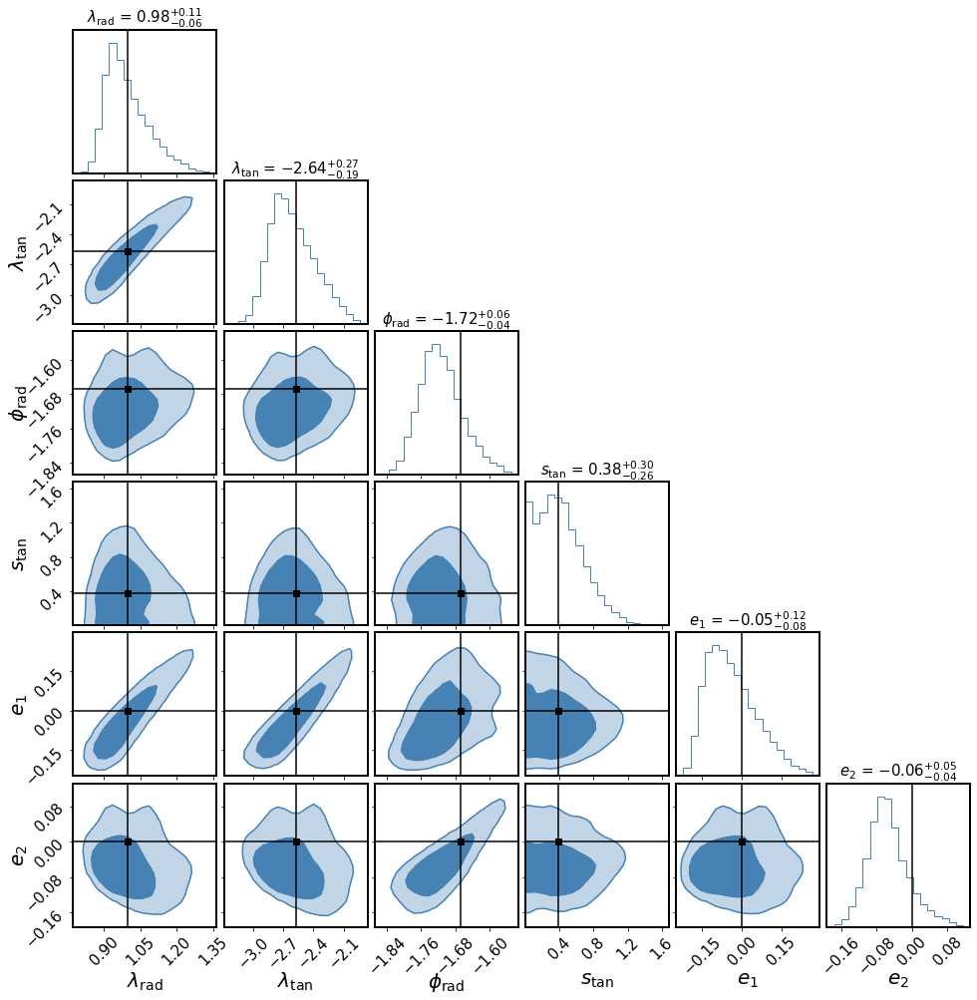

In [14]:
fig = plot_posterior_arc(0)
fig.show()

fig = plot_posterior_arc(1)
fig.show()

fig = plot_posterior_arc(2)
fig.show()

fig = plot_posterior_arc(3)
fig.show()

In [15]:
# cross-comparison of radial and tangential shear, and direction and radius

mcmc_new_list, mcmc_macro_fit, truths, labels_new = posterior_stretch(lens_model_list_arc)




/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:23: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


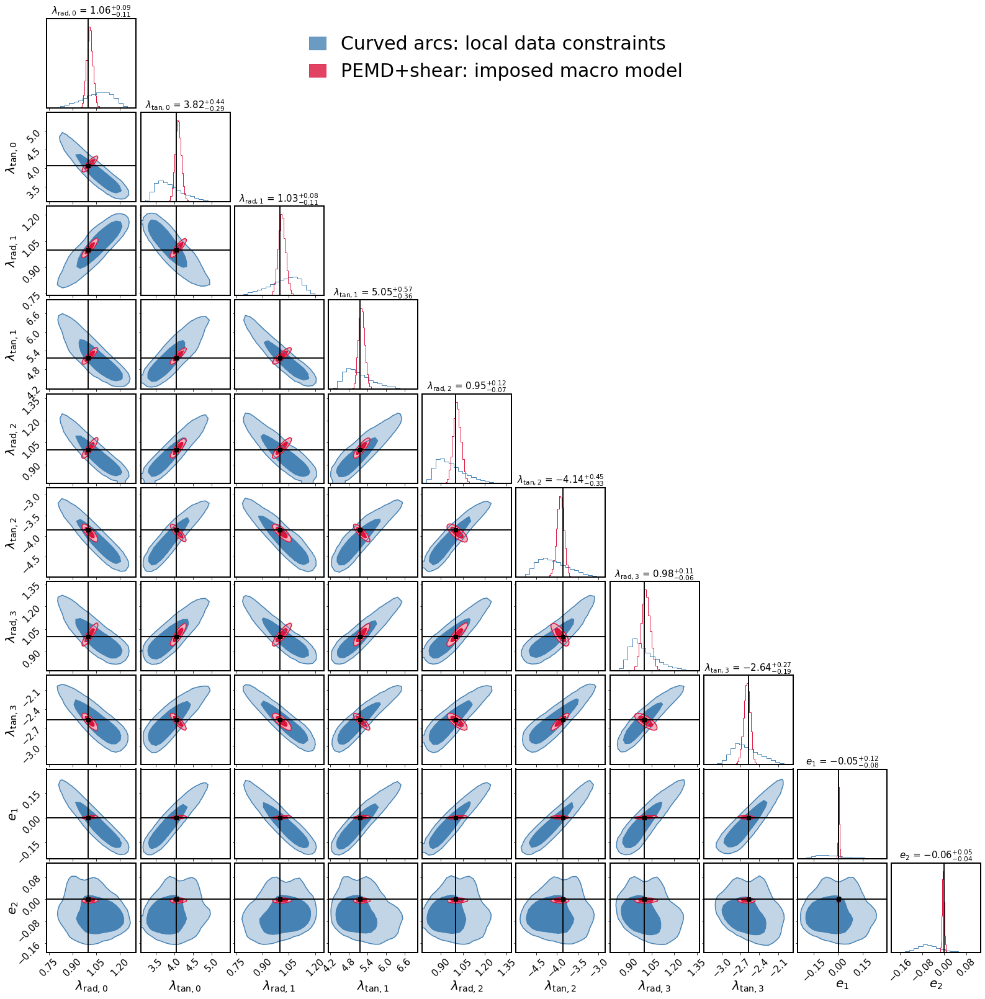

In [18]:

fig = corner.corner(mcmc_new_list, labels=labels_new, show_titles=True, truths=truths, **kwargs_corner)

fig = corner.corner(mcmc_macro_fit, fig=fig, labels=None, show_titles=False, truths=truths, 
                        **kwargs_corner_epl)



patch_1 = mpatches.Patch(color='steelblue', label='Curved arcs: local data constraints', alpha=alpha)
patch_2 = mpatches.Patch(color='crimson', label='PEMD+shear: imposed macro model', alpha=alpha)

ax = fig.axes[6]
ax.set_visible(True)
ax.set_frame_on(False)
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

ax.legend(handles=[patch_1, patch_2], fontsize=30, handlelength=0.9, loc=1, frameon=False)


#plt.savefig('/Users/sibirrer/Science/Publications/ArcPhenomenology/AAS/figures/example_posteriors.pdf', format='pdf', dpi=None, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, transparent=False, bbox_inches=None, pad_inches=0.1, frameon=None, metadata=None)  

fig.show()

In [21]:
def plot_mag_ratio(lens_model_list):
    
    mcmc_new_list = []
    labels_new = []
    index = 0
    truths = []
    i_arc = 0
    for model in lens_model_list:
        if model in ['CURVED_ARC', 'CURVED_ARC_SIS_MST', 'CURVED_ARC_TAN_DIFF']:
            kwargs_arc_true = ext.curved_arc_estimate(x_image[index], y_image[index], kwargs_lens_true)
            if i_arc == 0:
                s_r0_truth, s_t0_truth = kwargs_arc_true['radial_stretch'], kwargs_arc_true['tangential_stretch']
                mu0_truth = s_r0_truth * s_t0_truth
            else:
                labels_new += [r"$\mu_{%s} / \mu_0$" % str(index)]
                truths += [kwargs_arc_true['radial_stretch']*kwargs_arc_true['tangential_stretch']/mu0_truth]
            index += 1
            i_arc += 1
    e1_truth, e2_truth = kwargs_source_true[0]['e1'], kwargs_source_true[0]['e2']
    phi, q_truth = param_util.ellipticity2phi_q(kwargs_source_true[0]['e1'], kwargs_source_true[0]['e2'])
    
    if ellipticity_fixed:
        pass
    else:
        labels_new += [r"$e_1$", r"$e_2$"]
        truths += [e1_truth, e2_truth]
                                  
    for i in range(len(samples_mcmc_arc)):
        param_list = []
        i_arc = 0
        # transform the parameter position of the MCMC chain in a lenstronomy convention with keyword arguments #
        kwargs_result = param_arc.args2kwargs(samples_mcmc_arc[i])
        for index_lens, model in enumerate(lens_model_list):
            if model in ['CURVED_ARC', 'CURVED_ARC_SIS_MST', 'CURVED_ARC_TAN_DIFF']:                     
                kwargs_lens = kwargs_result['kwargs_lens']
                s_r = kwargs_lens[index_lens]['radial_stretch']
                s_t = kwargs_lens[index_lens]['tangential_stretch']
                phi = kwargs_lens[index_lens]['direction']
                radius = 1./kwargs_lens[index_lens]['curvature']
                if i_arc == 0:
                    s_r0, s_t0 = s_r, s_t
                    mu_0 = s_r0 * s_t0
                else:
                    param_list += [s_r*s_t/mu_0]
                i_arc += 1
        #r_source = kwargs_result['kwargs_source'][0]['R_sersic']
        e1, e2 = kwargs_result['kwargs_source'][0]['e1'], kwargs_result['kwargs_source'][0]['e2']
        phi_s, q_s = param_util.ellipticity2phi_q(e1, e2)
                                  
        if not ellipticity_fixed:
            param_list += [e1, e2]
        mcmc_new_list.append(param_list)
        
    # add (optional) constraints on local stretches from macro-model fit
    mcmc_macro_fit = []
    for i in range(len(samples_mcmc_epl)):
        param_list = []
        i_arc = 0
        kwargs_result = param_epl.args2kwargs(samples_mcmc_epl[i])
        for i_arc in range(len(x_image)):
            mu_i = lens_model_class.magnification(x_image[i_arc], y_image[i_arc], kwargs_result['kwargs_lens'])
            if i_arc == 0:
                mu_0 = mu_i
            else:
                param_list += [mu_i/mu_0]
            i_arc += 1

        #r_source = kwargs_result['kwargs_source'][0]['R_sersic']
        e1, e2 = kwargs_result['kwargs_source'][0]['e1'], kwargs_result['kwargs_source'][0]['e2']
        phi_s, q_s = param_util.ellipticity2phi_q(e1, e2)
                                  
        if not ellipticity_fixed:
            param_list += [e1, e2]
        mcmc_macro_fit.append(param_list)    
    return np.array(mcmc_new_list), np.array(mcmc_macro_fit), truths, labels_new





In [23]:

mcmc_mag_ratio_list, mcmc_mag_ratio_macro_fit, truths_mag_ratio, labels_mag_ratio = plot_mag_ratio(lens_model_list_arc)



/Users/sibirrer/Library/Python/3.6/lib/python/site-packages/ipykernel_launcher.py:23: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


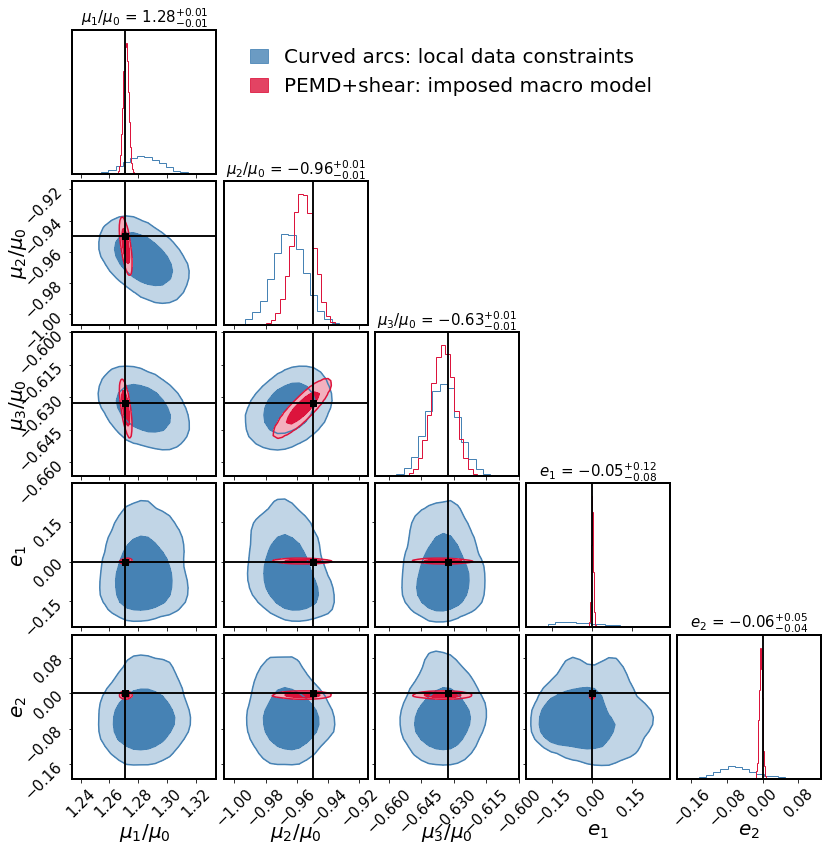

In [24]:
fig = corner.corner(mcmc_mag_ratio_list, labels=labels_mag_ratio, show_titles=True, truths=truths_mag_ratio, **kwargs_corner)

fig = corner.corner(mcmc_mag_ratio_macro_fit, fig=fig, labels=None, show_titles=False, truths=truths_mag_ratio, 
                        **kwargs_corner_epl)



patch_1 = mpatches.Patch(color='steelblue', label='Curved arcs: local data constraints', alpha=alpha)
patch_2 = mpatches.Patch(color='crimson', label='PEMD+shear: imposed macro model', alpha=alpha)

ax = fig.axes[3]
ax.set_visible(True)
ax.set_frame_on(False)
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

ax.legend(handles=[patch_1, patch_2], fontsize=20, handlelength=0.9, loc=1, frameon=False)


#plt.savefig('/Users/sibirrer/Science/Publications/ArcPhenomenology/AAS/figures/example_posteriors_mag_ratios.pdf', format='pdf', dpi=None, facecolor='w', edgecolor='w',
#        orientation='portrait', papertype=None, transparent=False, bbox_inches=None, pad_inches=0.1, frameon=None, metadata=None)  

fig.show()

